# Preparing

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import jdatetime
import random
import os
import numpy as np
import copy
import warnings
import itertools

from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline
from sklearn.metrics import det_curve, roc_auc_score, roc_auc_score, roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import BernoulliNB
from sklearn.neural_network import MLPClassifier
from sklearn.multioutput import MultiOutputClassifier

pd.options.display.max_columns = None
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams.update({'font.size': 15})
warnings.filterwarnings('ignore')

<h2>some helper functions </h2>

In [2]:
class ModelRecord:
    P_train = None
    P_test = None

    def __init__(self,
                 model,
                 ds,
                 feature_cols,
                 i_train,
                 target_cols=None,
                 i_test=None,
                 copy_model=True,
                 predict_method='predict_proba'):
        if copy_model:
            self.model = copy.deepcopy(model)
        else:
            self.model = model
        self.feature_cols = feature_cols
        self.X_train = ds.iloc[i_train][feature_cols].copy()
        self.i_train = i_train
        self.i_test = i_test
        if i_test is not None:
            self.X_test = ds.iloc[i_test][feature_cols].copy()
        if target_cols is not None:
            self.target_cols = target_cols
            self.Y_train = ds.iloc[i_train][target_cols].copy()
            if i_test is not None:
                self.Y_test = ds.iloc[i_test][target_cols].copy()
        self.predict_method = predict_method

    def fit(self, **kwargs):
        self.model.fit(self.X_train, self.Y_train, **kwargs)
        self.P_train = getattr(self.model, self.predict_method)(self.X_train)
        if self.i_test is not None:
            self.P_test = getattr(self.model, self.predict_method)(self.X_test)


def delong_roc_test(ground_truth, predictions_one, predictions_two):
    """
    Computes log(p-value) for hypothesis that two ROC AUCs are different
    Args:
       ground_truth: np.array of 0 and 1
       predictions_one: predictions of the first model,
          np.array of floats of the probability of being class 1
       predictions_two: predictions of the second model,
          np.array of floats of the probability of being class 1
    """
    def compute_midrank(x):
        """Computes midranks.
        Args:
           x - a 1D numpy array
        Returns:
           array of midranks
        """
        J = np.argsort(x)
        Z = x[J]
        N = len(x)
        T = np.zeros(N, dtype=float)
        i = 0
        while i < N:
            j = i
            while j < N and Z[j] == Z[i]:
                j += 1
            T[i:j] = 0.5 * (i + j - 1)
            i = j
        T2 = np.empty(N, dtype=float)
        # Note(kazeevn) +1 is due to Python using 0-based indexing
        # instead of 1-based in the AUC formula in the paper
        T2[J] = T + 1
        return T2

    def fastDeLong(predictions_sorted_transposed, label_1_count):
        """
        The fast version of DeLong's method for computing the covariance of
        unadjusted AUC.
        Args:
           predictions_sorted_transposed: a 2D numpy.array[n_classifiers, n_examples]
              sorted such as the examples with label "1" are first
        Returns:
           (AUC value, DeLong covariance)
        Reference:
         @article{sun2014fast,
           title={Fast Implementation of DeLong's Algorithm for
                  Comparing the Areas Under Correlated Receiver Operating Characteristic Curves},
           author={Xu Sun and Weichao Xu},
           journal={IEEE Signal Processing Letters},
           volume={21},
           number={11},
           pages={1389--1393},
           year={2014},
           publisher={IEEE}
         }
        """
        # Short variables are named as they are in the paper
        m = label_1_count
        n = predictions_sorted_transposed.shape[1] - m
        positive_examples = predictions_sorted_transposed[:, :m]
        negative_examples = predictions_sorted_transposed[:, m:]
        k = predictions_sorted_transposed.shape[0]

        tx = np.empty([k, m], dtype=float)
        ty = np.empty([k, n], dtype=float)
        tz = np.empty([k, m + n], dtype=float)
        for r in range(k):
            tx[r, :] = compute_midrank(positive_examples[r, :])
            ty[r, :] = compute_midrank(negative_examples[r, :])
            tz[r, :] = compute_midrank(predictions_sorted_transposed[r, :])
        aucs = tz[:, :m].sum(axis=1) / m / n - float(m + 1.0) / 2.0 / n
        v01 = (tz[:, :m] - tx[:, :]) / n
        v10 = 1.0 - (tz[:, m:] - ty[:, :]) / m
        sx = np.cov(v01)
        sy = np.cov(v10)
        delongcov = sx / m + sy / n
        return aucs, delongcov

    def calc_pvalue(aucs, sigma):
        """Computes log(10) of p-values.
        Args:
           aucs: 1D array of AUCs
           sigma: AUC DeLong covariances
        Returns:
           log10(pvalue)
        """
        l = np.array([[1, -1]])
        z = np.abs(np.diff(aucs)) / np.sqrt(np.dot(np.dot(l, sigma), l.T))
        return np.log10(2) + scipy.stats.norm.logsf(z, loc=0,
                                                    scale=1) / np.log(10)

    def compute_ground_truth_statistics(ground_truth):
        assert np.array_equal(np.unique(ground_truth), [0, 1])
        order = (-ground_truth).argsort()
        label_1_count = int(ground_truth.sum())
        return order, label_1_count

    def delong_roc_variance(ground_truth, predictions):
        """
        Computes ROC AUC variance for a single set of predictions
        Args:
           ground_truth: np.array of 0 and 1
           predictions: np.array of floats of the probability of being class 1
        """
        order, label_1_count = compute_ground_truth_statistics(ground_truth)
        predictions_sorted_transposed = predictions[np.newaxis, order]
        aucs, delongcov = fastDeLong(predictions_sorted_transposed,
                                     label_1_count)
        assert len(
            aucs
        ) == 1, "There is a bug in the code, please forward this to the developers"
        return aucs[0], delongcov

    order, label_1_count = compute_ground_truth_statistics(ground_truth)
    predictions_sorted_transposed = np.vstack(
        (predictions_one, predictions_two))[:, order]
    aucs, delongcov = fastDeLong(predictions_sorted_transposed, label_1_count)
    return calc_pvalue(aucs, delongcov)


def report_at_specificity(y_true, p_pred, at_specificity=0.5):
    if type(y_true) != np.ndarray:
        y_true = np.array(y_true)
    if type(p_pred) != np.ndarray:
        p_pred = np.array(p_pred)
    assert y_true.ndim == 1, f'y_true should be in 1-d array (current {y_true.shape})'
    assert p_pred.ndim == 1, f'p_pred should be in 1-d array (current {p_pred.shape})'

    fpr, fnr, thr = det_curve(y_true, p_pred)

    spec = 1 - fpr
    sens = 1 - fnr
    p_ = np.interp(at_specificity, spec, thr)
    y_pred = (p_pred >= p_).astype(int)

    spec = ((y_true == 0) & (y_pred == 0)).sum() / (y_true == 0).sum()
    sens = ((y_true == 1) & (y_pred == 1)).sum() / (y_true == 1).sum()
    npv = ((y_true == 0) & (y_pred == 0)).sum() / (y_pred == 0).sum()
    ppv = ((y_true == 1) & (y_pred == 1)).sum() / (y_pred == 1).sum()
    roc_auc = roc_auc_score(y_true, p_pred)
    ret = dict(specificity=spec,
               sensitivity=sens,
               npv=npv,
               ppv=ppv,
               roc_auc=roc_auc,
               threshold=p_)
    return ret

# Data loading

In [3]:
def to_jdate(x):
    if pd.isna(x):
        return pd.NaT
    x = x.strip()
    if x == '':
        return pd.NaT
    return jdatetime.datetime.strptime(x, '%Y-%m-%d').date()


def to_jdatetime(x):
    if pd.isna(x):
        return pd.NaT
    x = x.strip()
    if x == '':
        return pd.NaT
    return jdatetime.datetime.strptime(x, '%Y/%m/%d,%H:%M:%S').date()


dataset = pd.read_csv(
    './ds_processed.csv',
    index_col=0,
    low_memory=False,
)
dataset._Demo_BirthDate = dataset._Demo_BirthDate.apply(to_jdate)
dataset.Admission_Date = dataset.Admission_Date.apply(to_jdate)
dataset.Outcome_date = dataset.Outcome_date.apply(to_jdate)
dataset.Outcome_death_date = dataset.Outcome_death_date.apply(to_jdate)
dataset.Report_Date = dataset.Report_Date.apply(to_jdate)
aliases = pd.read_csv('./aliases.csv', index_col=0)['name']

In [4]:
pmh_cols = [x for x in dataset.columns if x.startswith('PMH_')]
symptom_cols = [x for x in dataset.columns if x.startswith('Symptom_')]
Demo_cols = [x for x in dataset.columns if x.startswith('Demo_')]

# Models

In [5]:
rnd_seed = 0


def reset_random_seeds():
    random.seed(rnd_seed)
    os.environ['PYTHONHASHSEED'] = str(rnd_seed)
    np.random.seed(rnd_seed)


reset_random_seeds()

## Mortality Prediction Model

In [6]:
record_book_mpm = {}
pmh_cols_ = pmh_cols.copy()
drop_pmhs = [
    'PMH_Covid', 'PMH_Other_DVT', 'PMH_Other_Psycho', 'PMH_Other_Transplant'
]
[pmh_cols_.remove(x) for x in drop_pmhs]
feature_cols = pmh_cols_ + Demo_cols
target_cols = ['Outcome_Death']

In [7]:
ds = dataset.loc[dataset.ds_lvl1][feature_cols + target_cols].copy()
ds[pmh_cols_] = ds[pmh_cols_].astype(int)

folds = StratifiedKFold(shuffle=True, random_state=rnd_seed)
folds = [x for x in folds.split(ds.values, ds[target_cols].sum(axis=1))]

gender_transformer = OrdinalEncoder(categories=[list('FM')], dtype=int)
age_transformer = StandardScaler()
preprocessor = [('gender_transformer', gender_transformer, ['Demo_Gender']),
                ('age_transformer', age_transformer, ['Demo_Age'])]
preprocessor = ColumnTransformer(preprocessor,
                                 remainder='passthrough',
                                 n_jobs=-1)
pipe = make_pipeline(preprocessor)

<h3>Logistic Regression</h3>


In [8]:
records = []
model = LogisticRegression(C=1, verbose=1, n_jobs=-1, random_state=rnd_seed)
pipe_ = copy.deepcopy(pipe)
pipe_.steps.append(('model', copy.deepcopy(model)))
for i_train, i_test in folds:
    rec_ = ModelRecord(copy.deepcopy(pipe_), ds, feature_cols, i_train,
                       target_cols, i_test)
    rec_.fit()
    records.append(rec_)
record_book_mpm['lr'] = records

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.2s finished


<h3>Random Forest</h3>

In [9]:
records = []
model = RandomForestClassifier(500,
                               criterion='gini',
                               verbose=1,
                               n_jobs=-1,
                               min_samples_leaf=0.001,
                               random_state=rnd_seed)
pipe_ = copy.deepcopy(pipe)
pipe_.steps.append(('model', copy.deepcopy(model)))
for i_train, i_test in folds:
    rec_ = ModelRecord(copy.deepcopy(pipe_), ds, feature_cols, i_train,
                       target_cols, i_test)
    rec_.fit()
    records.append(rec_)
record_book_mpm['rf'] = records

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:    1.4s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    0.3s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    0.3s finis

<h3>K Nearest Neighbors</h3>

In [10]:
records = []
model = KNeighborsClassifier(10, weights='distance', n_jobs=-1)
pipe_ = copy.deepcopy(pipe)
pipe_.steps.append(('model', copy.deepcopy(model)))
for i_train, i_test in folds:
    rec_ = ModelRecord(copy.deepcopy(pipe_), ds, feature_cols, i_train,
                       target_cols, i_test)
    rec_.fit()
    records.append(rec_)
record_book_mpm['knn'] = records

<h3>Linear Discriminant Analysis</h3>

In [11]:
records = []
model = LinearDiscriminantAnalysis(solver='svd')
pipe_ = copy.deepcopy(pipe)
pipe_.steps.append(('model', copy.deepcopy(model)))
for i_train, i_test in folds:
    rec_ = ModelRecord(copy.deepcopy(pipe_), ds, feature_cols, i_train,
                       target_cols, i_test)
    rec_.fit()
    records.append(rec_)
record_book_mpm['lda'] = records

<h3>Naive Bayes</h3>

In [12]:
records = []
model = BernoulliNB(binarize=0.1)
pipe_ = copy.deepcopy(pipe)
pipe_.steps.append(('model', copy.deepcopy(model)))
for i_train, i_test in folds:
    rec_ = ModelRecord(copy.deepcopy(pipe_), ds, feature_cols, i_train,
                       target_cols, i_test)
    rec_.fit()
    records.append(rec_)
record_book_mpm['nb'] = records

<h3>Artificial Neural Network</h3>

In [13]:
records = []
model = MLPClassifier((32, 16),
                      activation='tanh',
                      verbose=True,
                      random_state=rnd_seed)
pipe_ = copy.deepcopy(pipe)
pipe_.steps.append(('model', copy.deepcopy(model)))
for i_train, i_test in folds:
    rec_ = ModelRecord(copy.deepcopy(pipe_), ds, feature_cols, i_train,
                       target_cols, i_test)
    rec_.fit()
    records.append(rec_)
record_book_mpm['ann'] = records

Iteration 1, loss = 0.31267829
Iteration 2, loss = 0.27197501
Iteration 3, loss = 0.27027288
Iteration 4, loss = 0.26954995
Iteration 5, loss = 0.26911386
Iteration 6, loss = 0.26876772
Iteration 7, loss = 0.26860245
Iteration 8, loss = 0.26830264
Iteration 9, loss = 0.26786080
Iteration 10, loss = 0.26804608
Iteration 11, loss = 0.26753251
Iteration 12, loss = 0.26728512
Iteration 13, loss = 0.26708621
Iteration 14, loss = 0.26725988
Iteration 15, loss = 0.26723504
Iteration 16, loss = 0.26726660
Iteration 17, loss = 0.26681972
Iteration 18, loss = 0.26674851
Iteration 19, loss = 0.26672834
Iteration 20, loss = 0.26667626
Iteration 21, loss = 0.26653938
Iteration 22, loss = 0.26633357
Iteration 23, loss = 0.26634624
Iteration 24, loss = 0.26633841
Iteration 25, loss = 0.26597007
Iteration 26, loss = 0.26617038
Iteration 27, loss = 0.26601430
Iteration 28, loss = 0.26612091
Iteration 29, loss = 0.26600959
Iteration 30, loss = 0.26575083
Iteration 31, loss = 0.26586017
Iteration 32, los

Iteration 79, loss = 0.26624491
Iteration 80, loss = 0.26613386
Iteration 81, loss = 0.26616477
Iteration 82, loss = 0.26613052
Iteration 83, loss = 0.26609388
Iteration 84, loss = 0.26599750
Iteration 85, loss = 0.26604875
Iteration 86, loss = 0.26599321
Iteration 87, loss = 0.26609776
Iteration 88, loss = 0.26601672
Iteration 89, loss = 0.26593577
Iteration 90, loss = 0.26595819
Iteration 91, loss = 0.26593050
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 0.31307038
Iteration 2, loss = 0.27212228
Iteration 3, loss = 0.27045418
Iteration 4, loss = 0.26980087
Iteration 5, loss = 0.26938609
Iteration 6, loss = 0.26943013
Iteration 7, loss = 0.26893096
Iteration 8, loss = 0.26851884
Iteration 9, loss = 0.26816924
Iteration 10, loss = 0.26810423
Iteration 11, loss = 0.26811888
Iteration 12, loss = 0.26795368
Iteration 13, loss = 0.26754014
Iteration 14, loss = 0.26758261
Iteration 15, loss = 0.26740125
Iteration 16, loss = 0.

<h3>Summary</h3>

In [14]:
rep_ = {}
for m_, n_ in record_book_mpm.items():
    for g_ in ['train', 'test']:
        Y_att = 'Y_' + g_
        P_att = 'P_' + g_
        for c_, r_ in enumerate(n_):
            rep_[(m_.upper(), g_, c_)] = report_at_specificity(
                getattr(r_, Y_att).values[:, 0],
                getattr(r_, P_att)[:, 1], 0.7)

rep_ = pd.DataFrame(rep_).T.drop('threshold', axis=1)
rep_mean = np.round(rep_.groupby(level=[0, 1]).mean(), 3)
rep_std = np.round(rep_.groupby(level=[0, 1]).std(), 3)
rep_ = rep_mean.astype(str) + '(±' + rep_std.astype(str) + ')'
rep_.columns = rep_.columns + '(±std)'
rep_.index
rep_

specificity(±std) sensitivity(±std)      npv(±std)      ppv(±std)  \
ANN test      0.702(±0.002)     0.748(±0.033)  0.963(±0.005)  0.212(±0.007)   
    train     0.702(±0.002)      0.759(±0.01)  0.964(±0.001)  0.214(±0.002)   
KNN test      0.781(±0.069)     0.446(±0.085)   0.93(±0.005)  0.184(±0.027)   
    train     0.726(±0.022)     0.708(±0.032)  0.959(±0.003)  0.217(±0.007)   
LDA test      0.701(±0.001)     0.749(±0.028)  0.963(±0.004)  0.211(±0.006)   
    train     0.703(±0.003)     0.749(±0.011)  0.963(±0.001)  0.212(±0.002)   
LR  test      0.701(±0.002)     0.747(±0.031)  0.963(±0.004)  0.211(±0.006)   
    train     0.702(±0.001)      0.75(±0.006)  0.963(±0.001)  0.212(±0.002)   
NB  test      0.707(±0.003)       0.64(±0.03)  0.948(±0.004)   0.19(±0.007)   
    train     0.707(±0.001)     0.641(±0.007)  0.948(±0.001)   0.19(±0.002)   
RF  test      0.702(±0.001)     0.742(±0.024)  0.962(±0.003)   0.21(±0.006)   
    train     0.702(±0.002)     0.755(±0.008)  0.964(±0.001)  0.213(±0.002)   

           roc_auc(±std)  
ANN test   0.788(±0.011)  
    train  0.797(±0.003)  
KNN test   0.638(±0.019)  
    train   0.764(±0.01)  
LDA test   0.787(±0.012)  
    train  0.789(±0.003)  
LR  test   0.786(±0.012)  
    train  0.787(±0.003)  
NB  test    0.74(±0.014)  
    train   0.74(±0.003)  
RF  test    0.79(±0.013)  
    train  0.798(±0.003)

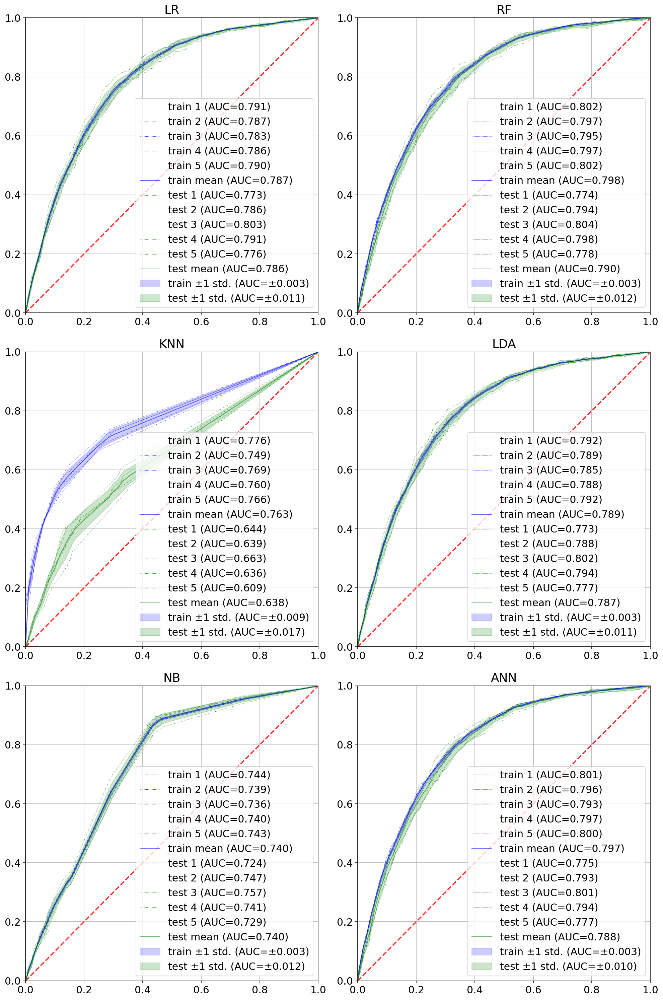

In [15]:
colors = {'train': 'b', 'test': 'g'}
mean_fpr = np.linspace(0, 1, 100)
plot_rows = int(np.ceil(len(record_book_mpm.keys()) / 2))
_, subs = plt.subplots(plot_rows, 2, figsize=(14, 7 * plot_rows))
subs = subs.flatten()

for c_, (m_, r_) in enumerate(record_book_mpm.items()):
    ax = subs[c_]
    plt.sca(ax)
    plt.title(m_.upper())
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', alpha=.8)
    for g_ in ['train', 'test']:
        tprs = []
        aucs = []
        for c2_, k_ in enumerate(r_):
            y_ = getattr(k_, f'Y_{g_}')['Outcome_Death']
            p_ = getattr(k_, f'P_{g_}')[:, 1]
            fpr_, tpr_, _ = roc_curve(y_, p_)
            auc_ = roc_auc_score(y_, p_)
            plt.plot(fpr_,
                     tpr_,
                     color=colors[g_],
                     lw=0.5,
                     linestyle=':',
                     label=f'{g_} {c2_+1} (AUC={auc_:.3f})')
            tprs.append(np.interp(mean_fpr, fpr_, tpr_))
            tprs[-1][0] = 0.0
            aucs.append(auc_)
        mean_tpr = np.mean(tprs, axis=0)
        mean_tpr[-1] = 1.0
        mean_auc = auc(mean_fpr, mean_tpr)
        std_auc = np.std(aucs)
        plt.plot(mean_fpr,
                 mean_tpr,
                 color=colors[g_],
                 lw=1,
                 alpha=0.6,
                 label=f'{g_} mean (AUC={mean_auc:.3f})')
        std_tpr = np.std(tprs, axis=0)
        tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
        tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
        plt.fill_between(mean_fpr,
                         tprs_lower,
                         tprs_upper,
                         color=colors[g_],
                         alpha=.2,
                         label=f'{g_} ±1 std. (AUC=±{std_auc:.3f})')
    plt.legend()
    plt.grid()
    plt.xlim(0, 1)
    plt.ylim(0, 1)
plt.tight_layout()

## Symptom Prediction Model

In [17]:
record_book_spm = {}
pmh_cols_ = pmh_cols.copy()
drop_pmhs = [
    'PMH_Covid', 'PMH_Other_DVT', 'PMH_Other_Psycho', 'PMH_Other_Transplant'
]
[pmh_cols_.remove(x) for x in drop_pmhs]
feature_cols = pmh_cols_ + Demo_cols

symptom_cols_ = symptom_cols.copy()
drop_symptoms = [
    'Symptom_Tachycardia',
    'Symptom_Seizure',
    'Symptom_NasalCongestion',
    'Symptom_SkinProblem',
]

[symptom_cols_.remove(x) for x in drop_symptoms]
target_cols = symptom_cols_

In [18]:
ds = dataset.loc[dataset.ds_lvl1 & dataset.ds_lvl2][feature_cols +
                                                    target_cols].copy()
ds[pmh_cols_] = ds[pmh_cols_].astype(int)

folds = StratifiedKFold(shuffle=True, random_state=rnd_seed)
folds = [x for x in folds.split(ds.values, ds[target_cols].sum(axis=1))]

gender_transformer = OrdinalEncoder(categories=[list('FM')], dtype=int)
age_transformer = StandardScaler()
preprocessor = [('gender_transformer', gender_transformer, ['Demo_Gender']),
                ('age_transformer', age_transformer, ['Demo_Age'])]
preprocessor = ColumnTransformer(preprocessor,
                                 remainder='passthrough',
                                 n_jobs=-1)
pipe = make_pipeline(preprocessor)

<h3>Logistic Regression</h3>


In [19]:
records = []
model = MultiOutputClassifier(LogisticRegression(C=1,
                                                 n_jobs=-1,
                                                 random_state=rnd_seed),
                              n_jobs=-1)
pipe_ = copy.deepcopy(pipe)
pipe_.steps.append(('model', copy.deepcopy(model)))
for i_train, i_test in folds:
    rec_ = ModelRecord(copy.deepcopy(pipe_), ds, feature_cols, i_train,
                       target_cols, i_test)
    rec_.fit()
    records.append(rec_)
record_book_spm['lr'] = records

<h3>Random Forest</h3>

In [20]:
records = []
model = RandomForestClassifier(200,
                               criterion='gini',
                               verbose=1,
                               n_jobs=-1,
                               min_samples_leaf=0.001,
                               random_state=rnd_seed)
pipe_ = copy.deepcopy(pipe)
pipe_.steps.append(('model', copy.deepcopy(model)))
for i_train, i_test in folds:
    rec_ = ModelRecord(copy.deepcopy(pipe_), ds, feature_cols, i_train,
                       target_cols, i_test)
    rec_.fit()
    records.append(rec_)
record_book_spm['rf'] = records

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    1.7s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    1.6s
[Parallel(n_jobs=8)]: Done 200 out of 200 | elapsed:    1.7s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.7s
[Parallel(n_jobs=8)]: Done 200 out of 200 | elapsed:    0.7s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 184 tasks

<h3>K Nearest Neighbors</h3>

In [21]:
records=[]
model = MultiOutputClassifier(KNeighborsClassifier(5,weights='distance'),n_jobs=-1) 
pipe_ = copy.deepcopy(pipe)
pipe_.steps.append(('model',copy.deepcopy(model)))
for i_train, i_test in folds:
    rec_=ModelRecord(copy.deepcopy(pipe_),ds,feature_cols,i_train,target_cols,i_test)
    rec_.fit()
    records.append(rec_)
record_book_spm['knn'] = records

<h3>Linear Discriminant Analysis</h3>

In [22]:
records=[]
model = MultiOutputClassifier(LinearDiscriminantAnalysis(solver='svd'),n_jobs=-1) 
pipe_ = copy.deepcopy(pipe)
pipe_.steps.append(('model',copy.deepcopy(model)))
for i_train, i_test in folds:
    rec_=ModelRecord(copy.deepcopy(pipe_),ds,feature_cols,i_train,target_cols,i_test)
    rec_.fit()
    records.append(rec_)
record_book_spm['lda'] = records

<h3>Naive Bayes</h3>

In [23]:
records=[]
model = MultiOutputClassifier(BernoulliNB(binarize=0.1),n_jobs=-1)
pipe_ = copy.deepcopy(pipe)
pipe_.steps.append(('model',copy.deepcopy(model)))
for i_train, i_test in folds:
    rec_=ModelRecord(copy.deepcopy(pipe_),ds,feature_cols,i_train,target_cols,i_test)
    rec_.fit()
    records.append(rec_)
record_book_spm['nb']=records

<h3>Artificial Neural Network</h3>

In [24]:
records = []
model = MLPClassifier((32, 32,32),
                      activation='tanh',
                      verbose=True,
                      max_iter=500,
                      random_state=rnd_seed)
pipe_ = copy.deepcopy(pipe)
pipe_.steps.append(('model', copy.deepcopy(model)))
for i_train, i_test in folds:
    rec_ = ModelRecord(copy.deepcopy(pipe_), ds, feature_cols, i_train,
                       target_cols, i_test)
    rec_.fit()
    records.append(rec_)
record_book_spm['ann'] = records

Iteration 1, loss = 5.16638431
Iteration 2, loss = 3.81125059
Iteration 3, loss = 3.76994100
Iteration 4, loss = 3.75650771
Iteration 5, loss = 3.75166715
Iteration 6, loss = 3.74754813
Iteration 7, loss = 3.74519699
Iteration 8, loss = 3.74156282
Iteration 9, loss = 3.73960336
Iteration 10, loss = 3.73702232
Iteration 11, loss = 3.73501966
Iteration 12, loss = 3.73401185
Iteration 13, loss = 3.73187461
Iteration 14, loss = 3.73078203
Iteration 15, loss = 3.73042192
Iteration 16, loss = 3.72884669
Iteration 17, loss = 3.72811126
Iteration 18, loss = 3.72731338
Iteration 19, loss = 3.72608688
Iteration 20, loss = 3.72634986
Iteration 21, loss = 3.72528739
Iteration 22, loss = 3.72504124
Iteration 23, loss = 3.72459741
Iteration 24, loss = 3.72424038
Iteration 25, loss = 3.72375496
Iteration 26, loss = 3.72323657
Iteration 27, loss = 3.72325631
Iteration 28, loss = 3.72289997
Iteration 29, loss = 3.72239124
Iteration 30, loss = 3.72293825
Iteration 31, loss = 3.72246646
Iteration 32, los

Iteration 254, loss = 3.68788711
Iteration 255, loss = 3.68695343
Iteration 256, loss = 3.68708489
Iteration 257, loss = 3.68750847
Iteration 258, loss = 3.68764722
Iteration 259, loss = 3.68669548
Iteration 260, loss = 3.68606569
Iteration 261, loss = 3.68663378
Iteration 262, loss = 3.68727000
Iteration 263, loss = 3.68621181
Iteration 264, loss = 3.68603433
Iteration 265, loss = 3.68722786
Iteration 266, loss = 3.68576264
Iteration 267, loss = 3.68572910
Iteration 268, loss = 3.68598585
Iteration 269, loss = 3.68433456
Iteration 270, loss = 3.68580101
Iteration 271, loss = 3.68501247
Iteration 272, loss = 3.68499954
Iteration 273, loss = 3.68433832
Iteration 274, loss = 3.68491004
Iteration 275, loss = 3.68429772
Iteration 276, loss = 3.68394522
Iteration 277, loss = 3.68360997
Iteration 278, loss = 3.68422275
Iteration 279, loss = 3.68360994
Iteration 280, loss = 3.68334908
Iteration 281, loss = 3.68376862
Iteration 282, loss = 3.68307117
Iteration 283, loss = 3.68335095
Iteration 

Iteration 4, loss = 3.74369365
Iteration 5, loss = 3.73781492
Iteration 6, loss = 3.73403753
Iteration 7, loss = 3.73099505
Iteration 8, loss = 3.72964669
Iteration 9, loss = 3.72693531
Iteration 10, loss = 3.72533302
Iteration 11, loss = 3.72341714
Iteration 12, loss = 3.72185724
Iteration 13, loss = 3.72101788
Iteration 14, loss = 3.71890971
Iteration 15, loss = 3.71740161
Iteration 16, loss = 3.71858224
Iteration 17, loss = 3.71616943
Iteration 18, loss = 3.71567081
Iteration 19, loss = 3.71464134
Iteration 20, loss = 3.71391358
Iteration 21, loss = 3.71300536
Iteration 22, loss = 3.71292386
Iteration 23, loss = 3.71248038
Iteration 24, loss = 3.71241367
Iteration 25, loss = 3.71185978
Iteration 26, loss = 3.71192876
Iteration 27, loss = 3.71209476
Iteration 28, loss = 3.71137508
Iteration 29, loss = 3.71130524
Iteration 30, loss = 3.71015917
Iteration 31, loss = 3.71038611
Iteration 32, loss = 3.71051283
Iteration 33, loss = 3.71001765
Iteration 34, loss = 3.70983041
Iteration 35, 

Iteration 256, loss = 3.67384031
Iteration 257, loss = 3.67432869
Iteration 258, loss = 3.67396899
Iteration 259, loss = 3.67427315
Iteration 260, loss = 3.67321149
Iteration 261, loss = 3.67323840
Iteration 262, loss = 3.67342916
Iteration 263, loss = 3.67317007
Iteration 264, loss = 3.67302825
Iteration 265, loss = 3.67282162
Iteration 266, loss = 3.67355671
Iteration 267, loss = 3.67247745
Iteration 268, loss = 3.67252211
Iteration 269, loss = 3.67246035
Iteration 270, loss = 3.67203570
Iteration 271, loss = 3.67154502
Iteration 272, loss = 3.67175635
Iteration 273, loss = 3.67145511
Iteration 274, loss = 3.67132843
Iteration 275, loss = 3.67171979
Iteration 276, loss = 3.67172277
Iteration 277, loss = 3.67089228
Iteration 278, loss = 3.67043028
Iteration 279, loss = 3.67095812
Iteration 280, loss = 3.67095803
Iteration 281, loss = 3.67014955
Iteration 282, loss = 3.67108635
Iteration 283, loss = 3.67127451
Iteration 284, loss = 3.67057876
Iteration 285, loss = 3.67039509
Iteration 

Iteration 5, loss = 3.74126985
Iteration 6, loss = 3.73755794
Iteration 7, loss = 3.73480045
Iteration 8, loss = 3.73239216
Iteration 9, loss = 3.72989986
Iteration 10, loss = 3.72760628
Iteration 11, loss = 3.72726899
Iteration 12, loss = 3.72519443
Iteration 13, loss = 3.72479951
Iteration 14, loss = 3.72391212
Iteration 15, loss = 3.72167000
Iteration 16, loss = 3.72016559
Iteration 17, loss = 3.72096442
Iteration 18, loss = 3.71944169
Iteration 19, loss = 3.71867126
Iteration 20, loss = 3.71852937
Iteration 21, loss = 3.71723288
Iteration 22, loss = 3.71717549
Iteration 23, loss = 3.71617292
Iteration 24, loss = 3.71739603
Iteration 25, loss = 3.71555931
Iteration 26, loss = 3.71586541
Iteration 27, loss = 3.71558452
Iteration 28, loss = 3.71365804
Iteration 29, loss = 3.71503405
Iteration 30, loss = 3.71427111
Iteration 31, loss = 3.71412904
Iteration 32, loss = 3.71348536
Iteration 33, loss = 3.71316281
Iteration 34, loss = 3.71337544
Iteration 35, loss = 3.71392592
Iteration 36,

Iteration 257, loss = 3.67624595
Iteration 258, loss = 3.67651934
Iteration 259, loss = 3.67527447
Iteration 260, loss = 3.67607499
Iteration 261, loss = 3.67577859
Iteration 262, loss = 3.67581711
Iteration 263, loss = 3.67517439
Iteration 264, loss = 3.67556555
Iteration 265, loss = 3.67466157
Iteration 266, loss = 3.67465462
Iteration 267, loss = 3.67447059
Iteration 268, loss = 3.67452486
Iteration 269, loss = 3.67427663
Iteration 270, loss = 3.67423174
Iteration 271, loss = 3.67442652
Iteration 272, loss = 3.67457717
Iteration 273, loss = 3.67361619
Iteration 274, loss = 3.67344624
Iteration 275, loss = 3.67314941
Iteration 276, loss = 3.67375906
Iteration 277, loss = 3.67318431
Iteration 278, loss = 3.67317184
Iteration 279, loss = 3.67298241
Iteration 280, loss = 3.67192926
Iteration 281, loss = 3.67303147
Iteration 282, loss = 3.67221272
Iteration 283, loss = 3.67247373
Iteration 284, loss = 3.67249330
Iteration 285, loss = 3.67241991
Iteration 286, loss = 3.67226025
Iteration 

Iteration 15, loss = 3.72237196
Iteration 16, loss = 3.72164484
Iteration 17, loss = 3.72061479
Iteration 18, loss = 3.71957116
Iteration 19, loss = 3.71846240
Iteration 20, loss = 3.71766163
Iteration 21, loss = 3.71683272
Iteration 22, loss = 3.71670800
Iteration 23, loss = 3.71667846
Iteration 24, loss = 3.71575267
Iteration 25, loss = 3.71553754
Iteration 26, loss = 3.71493510
Iteration 27, loss = 3.71426827
Iteration 28, loss = 3.71477002
Iteration 29, loss = 3.71383686
Iteration 30, loss = 3.71327339
Iteration 31, loss = 3.71383476
Iteration 32, loss = 3.71295215
Iteration 33, loss = 3.71274622
Iteration 34, loss = 3.71295960
Iteration 35, loss = 3.71186995
Iteration 36, loss = 3.71257385
Iteration 37, loss = 3.71242052
Iteration 38, loss = 3.71209142
Iteration 39, loss = 3.71162905
Iteration 40, loss = 3.71083779
Iteration 41, loss = 3.71170425
Iteration 42, loss = 3.71007302
Iteration 43, loss = 3.71084506
Iteration 44, loss = 3.71061904
Iteration 45, loss = 3.71038644
Iteratio

Iteration 267, loss = 3.67448593
Iteration 268, loss = 3.67503752
Iteration 269, loss = 3.67534006
Iteration 270, loss = 3.67432568
Iteration 271, loss = 3.67515527
Iteration 272, loss = 3.67385144
Iteration 273, loss = 3.67434469
Iteration 274, loss = 3.67531587
Iteration 275, loss = 3.67462119
Iteration 276, loss = 3.67339588
Iteration 277, loss = 3.67364974
Iteration 278, loss = 3.67368715
Iteration 279, loss = 3.67406988
Iteration 280, loss = 3.67391039
Iteration 281, loss = 3.67332875
Iteration 282, loss = 3.67308107
Iteration 283, loss = 3.67306538
Iteration 284, loss = 3.67279367
Iteration 285, loss = 3.67273470
Iteration 286, loss = 3.67250852
Iteration 287, loss = 3.67281341
Iteration 288, loss = 3.67221795
Iteration 289, loss = 3.67162220
Iteration 290, loss = 3.67182890
Iteration 291, loss = 3.67143006
Iteration 292, loss = 3.67197979
Iteration 293, loss = 3.67162377
Iteration 294, loss = 3.67188950
Iteration 295, loss = 3.67063389
Iteration 296, loss = 3.67172491
Iteration 

Iteration 17, loss = 3.72129907
Iteration 18, loss = 3.72115949
Iteration 19, loss = 3.71959856
Iteration 20, loss = 3.71927120
Iteration 21, loss = 3.71944737
Iteration 22, loss = 3.71785535
Iteration 23, loss = 3.71897578
Iteration 24, loss = 3.71713517
Iteration 25, loss = 3.71834094
Iteration 26, loss = 3.71711882
Iteration 27, loss = 3.71677335
Iteration 28, loss = 3.71623677
Iteration 29, loss = 3.71598157
Iteration 30, loss = 3.71525911
Iteration 31, loss = 3.71553067
Iteration 32, loss = 3.71522968
Iteration 33, loss = 3.71446617
Iteration 34, loss = 3.71505492
Iteration 35, loss = 3.71520221
Iteration 36, loss = 3.71471238
Iteration 37, loss = 3.71441521
Iteration 38, loss = 3.71368862
Iteration 39, loss = 3.71353125
Iteration 40, loss = 3.71316405
Iteration 41, loss = 3.71304933
Iteration 42, loss = 3.71318297
Iteration 43, loss = 3.71247271
Iteration 44, loss = 3.71248699
Iteration 45, loss = 3.71304978
Iteration 46, loss = 3.71243428
Iteration 47, loss = 3.71290175
Iteratio

Iteration 269, loss = 3.67758576
Iteration 270, loss = 3.67679913
Iteration 271, loss = 3.67671567
Iteration 272, loss = 3.67665109
Iteration 273, loss = 3.67677525
Iteration 274, loss = 3.67608229
Iteration 275, loss = 3.67602957
Iteration 276, loss = 3.67573670
Iteration 277, loss = 3.67635495
Iteration 278, loss = 3.67617903
Iteration 279, loss = 3.67548906
Iteration 280, loss = 3.67643023
Iteration 281, loss = 3.67478175
Iteration 282, loss = 3.67628433
Iteration 283, loss = 3.67591514
Iteration 284, loss = 3.67447785
Iteration 285, loss = 3.67525011
Iteration 286, loss = 3.67531785
Iteration 287, loss = 3.67403815
Iteration 288, loss = 3.67466007
Iteration 289, loss = 3.67504434
Iteration 290, loss = 3.67390798
Iteration 291, loss = 3.67424745
Iteration 292, loss = 3.67419481
Iteration 293, loss = 3.67421838
Iteration 294, loss = 3.67371351
Iteration 295, loss = 3.67357241
Iteration 296, loss = 3.67341898
Iteration 297, loss = 3.67275695
Iteration 298, loss = 3.67315687
Iteration 

### Summary

In [36]:
def assure_dims(d_):
    if type(d_) is np.ndarray:
        return [d_[:, [i_]] for i_ in range(d_.shape[1])]
    return d_


for c_sym, sym in enumerate(target_cols):
    rep_ = {}
    for m_, n_ in record_book_spm.items():
        for g_ in ['train', 'test']:
            Y_att = 'Y_' + g_
            P_att = 'P_' + g_
            for c_, r_ in enumerate(n_):
                rep_[(m_.upper(), g_, c_)] = report_at_specificity(
                    getattr(r_, Y_att).values[:, c_sym],
                    assure_dims(getattr(r_, P_att))[c_sym][:, -1], 0.7)

    rep_ = pd.DataFrame(rep_).T.drop('threshold', axis=1)
    rep_mean = np.round(rep_.groupby(level=[0, 1]).mean(), 3)
    rep_std = np.round(rep_.groupby(level=[0, 1]).std(), 3)
    rep_ = rep_mean.astype(str) + '(±' + rep_std.astype(str) + ')'
    rep_.columns = pd.MultiIndex.from_product(
        ([sym.replace('_', ':')], rep_.columns + '(±std)'))
    rep_.index
    display(rep_)

Symptom:RespiratoryDistress                                   \
                    specificity(±std) sensitivity(±std)      npv(±std)   
ANN test                0.703(±0.003)      0.453(±0.02)  0.625(±0.006)   
    train               0.702(±0.002)     0.489(±0.005)   0.64(±0.002)   
KNN test                 0.692(±0.07)     0.366(±0.072)  0.586(±0.006)   
    train               0.746(±0.067)     0.454(±0.071)    0.64(±0.01)   
LDA test                0.703(±0.002)     0.465(±0.018)   0.63(±0.005)   
    train               0.702(±0.001)     0.466(±0.004)   0.63(±0.002)   
LR  test                0.702(±0.002)     0.464(±0.016)   0.63(±0.004)   
    train               0.702(±0.002)     0.465(±0.005)   0.63(±0.002)   
NB  test                0.763(±0.064)     0.366(±0.092)  0.611(±0.015)   
    train               0.708(±0.003)     0.437(±0.005)   0.62(±0.001)   
RF  test                0.703(±0.002)     0.459(±0.019)  0.627(±0.005)   
    train               0.701(±0.002)     0.473(±0.004)  0.633(±0.001)   

                                         
               ppv(±std)  roc_auc(±std)  
ANN test    0.54(±0.014)  0.612(±0.008)  
    train  0.558(±0.003)  0.636(±0.003)  
KNN test    0.48(±0.014)  0.545(±0.008)  
    train  0.585(±0.038)  0.652(±0.004)  
LDA test   0.547(±0.013)   0.619(±0.01)  
    train  0.546(±0.004)  0.621(±0.003)  
LR  test   0.546(±0.013)   0.619(±0.01)  
    train  0.546(±0.004)  0.621(±0.003)  
NB  test   0.544(±0.018)  0.605(±0.013)  
    train  0.536(±0.004)  0.606(±0.003)  
RF  test   0.543(±0.015)  0.619(±0.011)  
    train   0.55(±0.002)  0.626(±0.002)

Symptom:ConsciousnessDisorder                                   \
                      specificity(±std) sensitivity(±std)      npv(±std)   
ANN test                  0.702(±0.001)     0.714(±0.057)  0.988(±0.003)   
    train                 0.703(±0.001)     0.769(±0.011)   0.99(±0.001)   
KNN test                    0.9(±0.011)     0.226(±0.007)  0.975(±0.002)   
    train                 0.927(±0.007)     0.623(±0.016)    0.988(±0.0)   
LDA test                  0.702(±0.002)     0.746(±0.017)  0.989(±0.001)   
    train                 0.701(±0.001)     0.744(±0.004)    0.989(±0.0)   
LR  test                  0.702(±0.002)     0.747(±0.031)  0.989(±0.002)   
    train                 0.702(±0.002)     0.752(±0.012)  0.989(±0.001)   
NB  test                  0.815(±0.008)     0.533(±0.033)  0.983(±0.002)   
    train                 0.815(±0.002)     0.533(±0.008)    0.983(±0.0)   
RF  test                      0.7(±0.0)      0.744(±0.02)  0.989(±0.001)   
    train                 0.701(±0.001)     0.752(±0.005)    0.989(±0.0)   

                                         
               ppv(±std)  roc_auc(±std)  
ANN test   0.067(±0.007)  0.756(±0.022)  
    train  0.073(±0.001)  0.809(±0.005)  
KNN test   0.064(±0.009)  0.563(±0.005)  
    train  0.206(±0.014)  0.789(±0.007)  
LDA test    0.07(±0.005)  0.772(±0.008)  
    train   0.07(±0.001)  0.778(±0.003)  
LR  test    0.07(±0.006)  0.774(±0.015)  
    train  0.071(±0.001)  0.779(±0.003)  
NB  test    0.08(±0.008)  0.756(±0.008)  
    train   0.08(±0.002)  0.756(±0.002)  
RF  test    0.07(±0.004)  0.776(±0.006)  
    train  0.071(±0.001)  0.792(±0.003)

Symptom:OlfaTasteLoss                                   \
              specificity(±std) sensitivity(±std)      npv(±std)   
ANN test          0.701(±0.002)     0.459(±0.035)  0.978(±0.003)   
    train         0.702(±0.002)     0.527(±0.022)  0.981(±0.001)   
KNN test           0.866(±0.02)     0.177(±0.036)  0.974(±0.004)   
    train          0.875(±0.02)     0.417(±0.028)  0.981(±0.001)   
LDA test          0.704(±0.004)     0.424(±0.017)  0.977(±0.003)   
    train         0.705(±0.002)     0.462(±0.011)  0.979(±0.001)   
LR  test          0.705(±0.006)      0.44(±0.036)  0.978(±0.003)   
    train         0.706(±0.004)      0.466(±0.01)  0.979(±0.001)   
NB  test           0.746(±0.09)     0.341(±0.123)  0.976(±0.002)   
    train         0.745(±0.094)     0.368(±0.126)  0.977(±0.002)   
RF  test          0.706(±0.004)      0.47(±0.032)  0.979(±0.003)   
    train         0.704(±0.004)     0.527(±0.009)    0.981(±0.0)   

                                         
               ppv(±std)  roc_auc(±std)  
ANN test   0.042(±0.004)   0.607(±0.02)  
    train  0.048(±0.003)  0.669(±0.011)  
KNN test   0.036(±0.007)  0.521(±0.017)  
    train   0.088(±0.01)  0.657(±0.012)  
LDA test   0.039(±0.004)  0.611(±0.011)  
    train  0.043(±0.001)  0.628(±0.003)  
LR  test   0.041(±0.003)  0.614(±0.012)  
    train  0.043(±0.002)  0.629(±0.003)  
NB  test   0.037(±0.006)  0.594(±0.003)  
    train   0.04(±0.003)  0.606(±0.003)  
RF  test   0.044(±0.005)  0.624(±0.015)  
    train  0.048(±0.002)  0.671(±0.005)

Symptom:Cough                                                  \
          specificity(±std) sensitivity(±std)      npv(±std)      ppv(±std)   
ANN test      0.703(±0.001)     0.329(±0.008)  0.506(±0.006)   0.53(±0.008)   
    train     0.702(±0.002)     0.376(±0.004)  0.524(±0.001)  0.563(±0.003)   
KNN test      0.777(±0.031)     0.234(±0.028)  0.498(±0.006)  0.517(±0.011)   
    train     0.838(±0.032)     0.302(±0.037)   0.54(±0.005)  0.657(±0.018)   
LDA test      0.704(±0.002)     0.324(±0.012)  0.505(±0.008)   0.528(±0.01)   
    train     0.704(±0.003)     0.325(±0.004)  0.506(±0.002)  0.529(±0.002)   
LR  test      0.704(±0.002)     0.324(±0.012)  0.505(±0.008)   0.528(±0.01)   
    train     0.704(±0.003)     0.325(±0.004)  0.506(±0.002)  0.529(±0.002)   
NB  test      0.839(±0.126)     0.187(±0.144)  0.504(±0.012)  0.545(±0.011)   
    train     0.791(±0.123)     0.245(±0.134)  0.507(±0.005)   0.553(±0.02)   
RF  test      0.702(±0.001)      0.34(±0.007)  0.511(±0.005)  0.538(±0.009)   
    train     0.704(±0.002)     0.364(±0.004)   0.52(±0.003)  0.557(±0.002)   

                          
           roc_auc(±std)  
ANN test   0.531(±0.003)  
    train   0.57(±0.001)  
KNN test   0.508(±0.007)  
    train  0.623(±0.006)  
LDA test   0.532(±0.009)  
    train  0.536(±0.002)  
LR  test   0.532(±0.009)  
    train  0.536(±0.002)  
NB  test   0.534(±0.006)  
    train  0.537(±0.002)  
RF  test   0.538(±0.007)  
    train  0.558(±0.002)

Symptom:Headache                                                  \
          specificity(±std) sensitivity(±std)      npv(±std)      ppv(±std)   
ANN test      0.703(±0.003)     0.422(±0.019)  0.961(±0.001)  0.066(±0.006)   
    train     0.706(±0.003)     0.498(±0.006)    0.966(±0.0)  0.077(±0.001)   
KNN test      0.795(±0.009)     0.215(±0.021)  0.953(±0.002)  0.049(±0.006)   
    train      0.82(±0.012)     0.491(±0.027)   0.97(±0.001)  0.119(±0.003)   
LDA test      0.704(±0.002)     0.441(±0.031)  0.962(±0.003)  0.068(±0.005)   
    train     0.701(±0.002)     0.457(±0.008)  0.963(±0.001)   0.07(±0.001)   
LR  test      0.704(±0.003)     0.437(±0.025)  0.962(±0.003)  0.068(±0.004)   
    train     0.702(±0.003)     0.453(±0.005)  0.963(±0.001)   0.07(±0.001)   
NB  test      0.795(±0.017)     0.332(±0.021)   0.96(±0.003)  0.074(±0.008)   
    train     0.794(±0.008)     0.332(±0.008)   0.96(±0.001)  0.074(±0.002)   
RF  test      0.703(±0.004)     0.458(±0.018)  0.963(±0.002)  0.071(±0.005)   
    train     0.705(±0.001)     0.488(±0.002)    0.965(±0.0)  0.076(±0.001)   

                          
           roc_auc(±std)  
ANN test   0.597(±0.019)  
    train  0.656(±0.006)  
KNN test   0.505(±0.009)  
    train  0.675(±0.009)  
LDA test   0.618(±0.014)  
    train  0.626(±0.003)  
LR  test   0.618(±0.012)  
    train  0.626(±0.003)  
NB  test   0.604(±0.018)  
    train  0.606(±0.005)  
RF  test   0.618(±0.012)  
    train  0.643(±0.003)

Symptom:Vertigo                                                  \
          specificity(±std) sensitivity(±std)      npv(±std)      ppv(±std)   
ANN test      0.703(±0.002)     0.463(±0.031)  0.984(±0.002)  0.032(±0.002)   
    train     0.702(±0.001)     0.588(±0.014)  0.988(±0.001)  0.041(±0.001)   
KNN test      0.908(±0.023)     0.109(±0.028)  0.979(±0.003)  0.025(±0.007)   
    train     0.923(±0.022)     0.505(±0.012)    0.989(±0.0)   0.13(±0.031)   
LDA test      0.702(±0.001)     0.507(±0.036)  0.985(±0.001)  0.036(±0.006)   
    train     0.704(±0.003)     0.514(±0.009)    0.985(±0.0)  0.036(±0.001)   
LR  test      0.704(±0.003)     0.503(±0.035)  0.985(±0.001)  0.035(±0.006)   
    train     0.704(±0.004)      0.51(±0.013)    0.985(±0.0)  0.036(±0.001)   
NB  test      0.761(±0.009)     0.474(±0.044)  0.985(±0.001)  0.041(±0.007)   
    train     0.761(±0.001)      0.478(±0.01)    0.985(±0.0)  0.041(±0.002)   
RF  test      0.702(±0.002)     0.532(±0.019)  0.986(±0.001)  0.037(±0.005)   
    train     0.702(±0.002)     0.559(±0.009)    0.987(±0.0)  0.039(±0.001)   

                          
           roc_auc(±std)  
ANN test   0.592(±0.019)  
    train  0.697(±0.003)  
KNN test   0.509(±0.015)  
    train  0.726(±0.004)  
LDA test   0.639(±0.017)  
    train  0.649(±0.003)  
LR  test   0.638(±0.016)  
    train  0.647(±0.003)  
NB  test   0.619(±0.035)  
    train  0.628(±0.007)  
RF  test   0.638(±0.015)  
    train  0.687(±0.005)

Symptom:Pararesis                                                  \
          specificity(±std) sensitivity(±std)      npv(±std)      ppv(±std)   
ANN test      0.703(±0.003)      0.36(±0.112)  0.996(±0.001)  0.007(±0.005)   
    train     0.703(±0.001)     0.671(±0.037)    0.998(±0.0)  0.011(±0.001)   
KNN test      0.979(±0.004)     0.027(±0.038)  0.995(±0.002)   0.007(±0.01)   
    train     0.984(±0.004)     0.527(±0.043)    0.998(±0.0)  0.147(±0.034)   
LDA test      0.703(±0.001)     0.606(±0.086)  0.997(±0.001)   0.01(±0.004)   
    train     0.702(±0.001)     0.613(±0.031)    0.997(±0.0)   0.01(±0.001)   
LR  test      0.702(±0.001)     0.602(±0.099)  0.997(±0.001)   0.01(±0.004)   
    train     0.702(±0.002)     0.628(±0.035)    0.997(±0.0)  0.011(±0.001)   
NB  test      0.784(±0.007)     0.517(±0.128)  0.997(±0.001)  0.012(±0.005)   
    train     0.784(±0.007)     0.523(±0.028)    0.997(±0.0)  0.012(±0.001)   
RF  test      0.702(±0.001)      0.578(±0.17)  0.997(±0.001)   0.01(±0.005)   
    train     0.702(±0.002)     0.708(±0.012)    0.998(±0.0)  0.012(±0.001)   

                          
           roc_auc(±std)  
ANN test    0.56(±0.062)  
    train  0.763(±0.013)  
KNN test   0.503(±0.017)  
    train  0.758(±0.022)  
LDA test   0.694(±0.052)  
    train  0.716(±0.011)  
LR  test   0.702(±0.058)  
    train  0.718(±0.011)  
NB  test   0.697(±0.067)  
    train  0.716(±0.012)  
RF  test   0.682(±0.064)  
    train   0.775(±0.01)

Symptom:ChestPain                                                  \
          specificity(±std) sensitivity(±std)      npv(±std)      ppv(±std)   
ANN test      0.702(±0.002)     0.522(±0.015)  0.978(±0.002)  0.054(±0.005)   
    train     0.704(±0.002)     0.596(±0.005)  0.982(±0.001)  0.061(±0.001)   
KNN test      0.875(±0.015)     0.177(±0.028)  0.971(±0.002)  0.044(±0.008)   
    train      0.897(±0.01)     0.549(±0.009)    0.984(±0.0)  0.147(±0.013)   
LDA test      0.705(±0.003)     0.534(±0.036)  0.979(±0.001)  0.056(±0.007)   
    train     0.704(±0.002)     0.545(±0.008)    0.979(±0.0)  0.056(±0.002)   
LR  test      0.703(±0.002)      0.53(±0.036)  0.979(±0.001)  0.055(±0.007)   
    train     0.703(±0.003)      0.544(±0.01)    0.979(±0.0)  0.056(±0.001)   
NB  test      0.775(±0.006)     0.503(±0.032)   0.98(±0.002)  0.068(±0.007)   
    train     0.775(±0.006)     0.504(±0.009)     0.98(±0.0)  0.068(±0.001)   
RF  test      0.704(±0.004)     0.561(±0.014)   0.98(±0.002)  0.058(±0.005)   
    train     0.702(±0.002)     0.586(±0.006)    0.981(±0.0)   0.06(±0.001)   

                          
           roc_auc(±std)  
ANN test   0.637(±0.009)  
    train  0.709(±0.003)  
KNN test   0.528(±0.012)  
    train   0.74(±0.004)  
LDA test   0.656(±0.022)  
    train  0.672(±0.005)  
LR  test   0.656(±0.022)  
    train  0.671(±0.004)  
NB  test   0.642(±0.033)  
    train  0.646(±0.008)  
RF  test   0.667(±0.013)  
    train  0.703(±0.003)

Symptom:SoreThroat                                                  \
           specificity(±std) sensitivity(±std)      npv(±std)      ppv(±std)   
ANN test       0.705(±0.002)       0.457(±0.1)  0.995(±0.002)   0.01(±0.001)   
    train      0.705(±0.002)     0.575(±0.016)    0.996(±0.0)  0.013(±0.001)   
KNN test       0.981(±0.008)     0.023(±0.023)  0.993(±0.001)  0.012(±0.017)   
    train      0.983(±0.007)     0.175(±0.027)    0.994(±0.0)   0.068(±0.02)   
LDA test       0.704(±0.004)        0.51(±0.1)  0.995(±0.002)  0.011(±0.001)   
    train      0.702(±0.003)      0.538(±0.03)    0.996(±0.0)    0.012(±0.0)   
LR  test       0.704(±0.004)     0.523(±0.104)  0.995(±0.002)  0.011(±0.001)   
    train      0.704(±0.002)     0.536(±0.019)    0.996(±0.0)    0.012(±0.0)   
NB  test       0.757(±0.007)     0.395(±0.025)  0.995(±0.001)  0.011(±0.002)   
    train      0.759(±0.004)     0.422(±0.012)    0.995(±0.0)    0.011(±0.0)   
RF  test       0.705(±0.003)     0.495(±0.095)  0.995(±0.002)  0.011(±0.001)   
    train      0.704(±0.004)     0.604(±0.017)    0.996(±0.0)    0.013(±0.0)   

                          
           roc_auc(±std)  
ANN test    0.633(±0.05)  
    train  0.715(±0.012)  
KNN test   0.502(±0.013)  
    train  0.579(±0.011)  
LDA test   0.661(±0.056)  
    train  0.688(±0.012)  
LR  test   0.671(±0.052)  
    train   0.69(±0.012)  
NB  test   0.646(±0.029)  
    train  0.658(±0.007)  
RF  test    0.652(±0.05)  
    train  0.743(±0.014)

Symptom:PainOrFatigue                                   \
              specificity(±std) sensitivity(±std)      npv(±std)   
ANN test          0.702(±0.002)     0.373(±0.016)  0.637(±0.008)   
    train         0.704(±0.003)     0.406(±0.007)   0.65(±0.003)   
KNN test          0.801(±0.096)     0.228(±0.107)   0.62(±0.013)   
    train          0.793(±0.11)      0.355(±0.14)  0.661(±0.016)   
LDA test          0.704(±0.005)     0.377(±0.021)  0.639(±0.012)   
    train         0.704(±0.002)     0.379(±0.004)   0.64(±0.002)   
LR  test          0.704(±0.005)     0.377(±0.021)  0.639(±0.012)   
    train         0.703(±0.002)     0.379(±0.004)   0.64(±0.002)   
NB  test          0.793(±0.007)     0.257(±0.008)   0.626(±0.01)   
    train         0.793(±0.002)     0.258(±0.003)  0.626(±0.002)   
RF  test          0.701(±0.002)     0.381(±0.023)   0.64(±0.012)   
    train         0.703(±0.003)     0.388(±0.006)  0.643(±0.002)   

                                         
               ppv(±std)  roc_auc(±std)  
ANN test    0.444(±0.02)  0.555(±0.011)  
    train  0.467(±0.004)  0.589(±0.001)  
KNN test   0.424(±0.025)   0.52(±0.014)  
    train  0.541(±0.051)   0.63(±0.007)  
LDA test   0.448(±0.014)   0.558(±0.01)  
    train  0.449(±0.004)   0.56(±0.002)  
LR  test   0.448(±0.015)   0.558(±0.01)  
    train  0.449(±0.004)   0.56(±0.002)  
NB  test   0.442(±0.011)  0.552(±0.005)  
    train  0.443(±0.003)  0.554(±0.001)  
RF  test   0.448(±0.017)  0.561(±0.009)  
    train  0.454(±0.005)  0.575(±0.002)

Symptom:FeverOrChill                                   \
             specificity(±std) sensitivity(±std)      npv(±std)   
ANN test         0.705(±0.001)     0.321(±0.017)  0.648(±0.005)   
    train        0.704(±0.002)     0.369(±0.004)  0.665(±0.001)   
KNN test         0.712(±0.022)     0.284(±0.022)  0.638(±0.007)   
    train        0.763(±0.026)     0.386(±0.026)  0.688(±0.003)   
LDA test         0.704(±0.002)     0.329(±0.014)  0.651(±0.007)   
    train        0.703(±0.002)     0.337(±0.005)  0.653(±0.002)   
LR  test         0.705(±0.002)     0.328(±0.014)  0.651(±0.007)   
    train        0.704(±0.002)     0.337(±0.005)  0.653(±0.002)   
NB  test         0.832(±0.119)     0.191(±0.132)  0.647(±0.005)   
    train          0.882(±0.1)     0.146(±0.106)  0.648(±0.003)   
RF  test         0.705(±0.003)     0.325(±0.016)   0.65(±0.004)   
    train        0.703(±0.002)      0.36(±0.005)  0.661(±0.002)   

                                         
               ppv(±std)  roc_auc(±std)  
ANN test    0.38(±0.016)   0.52(±0.012)  
    train  0.413(±0.004)  0.561(±0.004)  
KNN test   0.357(±0.007)  0.498(±0.005)  
    train  0.479(±0.012)   0.62(±0.005)  
LDA test   0.385(±0.012)  0.526(±0.008)  
    train   0.39(±0.004)  0.531(±0.002)  
LR  test   0.385(±0.012)  0.525(±0.008)  
    train   0.39(±0.004)  0.531(±0.002)  
NB  test   0.393(±0.011)   0.524(±0.01)  
    train  0.425(±0.022)  0.532(±0.002)  
RF  test   0.382(±0.015)  0.523(±0.011)  
    train  0.406(±0.003)  0.552(±0.001)

Symptom:Gastrointestinal                                   \
                 specificity(±std) sensitivity(±std)      npv(±std)   
ANN test             0.703(±0.004)     0.441(±0.016)  0.915(±0.005)   
    train            0.703(±0.003)      0.487(±0.01)  0.922(±0.001)   
KNN test             0.882(±0.007)     0.185(±0.013)  0.903(±0.006)   
    train            0.914(±0.009)     0.375(±0.009)  0.926(±0.001)   
LDA test             0.705(±0.002)     0.461(±0.016)  0.918(±0.007)   
    train            0.706(±0.003)     0.459(±0.004)  0.918(±0.002)   
LR  test             0.704(±0.002)      0.459(±0.02)  0.918(±0.007)   
    train            0.706(±0.003)      0.46(±0.004)  0.918(±0.002)   
NB  test             0.774(±0.009)     0.395(±0.008)  0.917(±0.005)   
    train            0.774(±0.003)     0.396(±0.002)  0.917(±0.001)   
RF  test             0.705(±0.003)     0.463(±0.009)  0.919(±0.005)   
    train            0.703(±0.002)     0.475(±0.003)   0.92(±0.002)   

                                         
               ppv(±std)  roc_auc(±std)  
ANN test   0.147(±0.009)  0.593(±0.004)  
    train   0.16(±0.004)  0.634(±0.004)  
KNN test   0.154(±0.017)  0.526(±0.009)  
    train  0.336(±0.015)  0.686(±0.006)  
LDA test   0.153(±0.006)  0.605(±0.014)  
    train  0.154(±0.001)  0.606(±0.003)  
LR  test   0.152(±0.006)  0.605(±0.014)  
    train  0.154(±0.001)  0.606(±0.003)  
NB  test    0.169(±0.01)  0.584(±0.012)  
    train  0.169(±0.002)  0.585(±0.003)  
RF  test   0.154(±0.008)  0.611(±0.012)  
    train  0.157(±0.002)  0.625(±0.002)

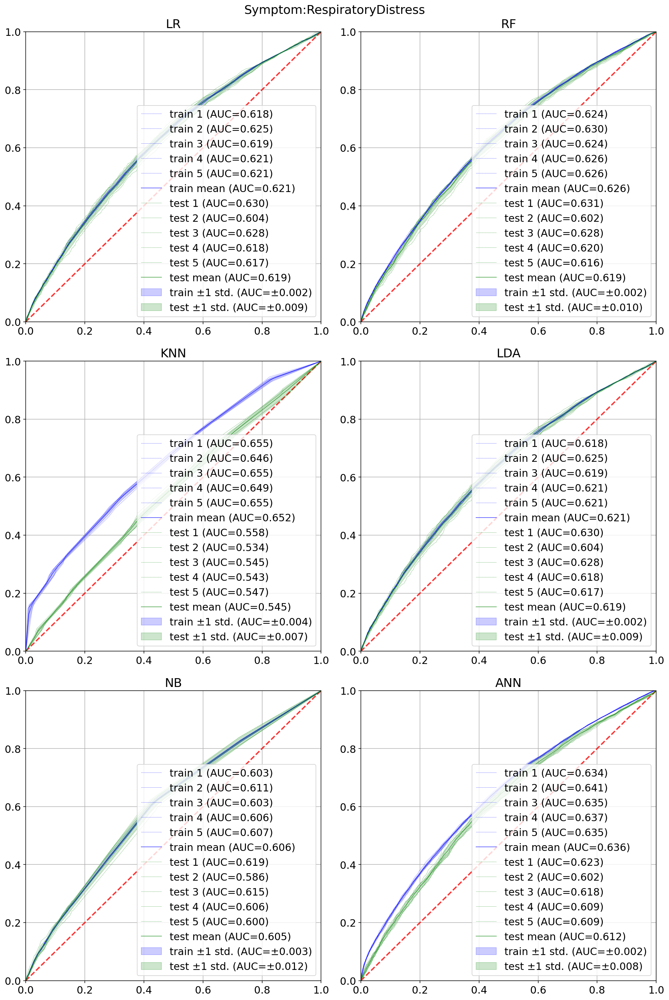

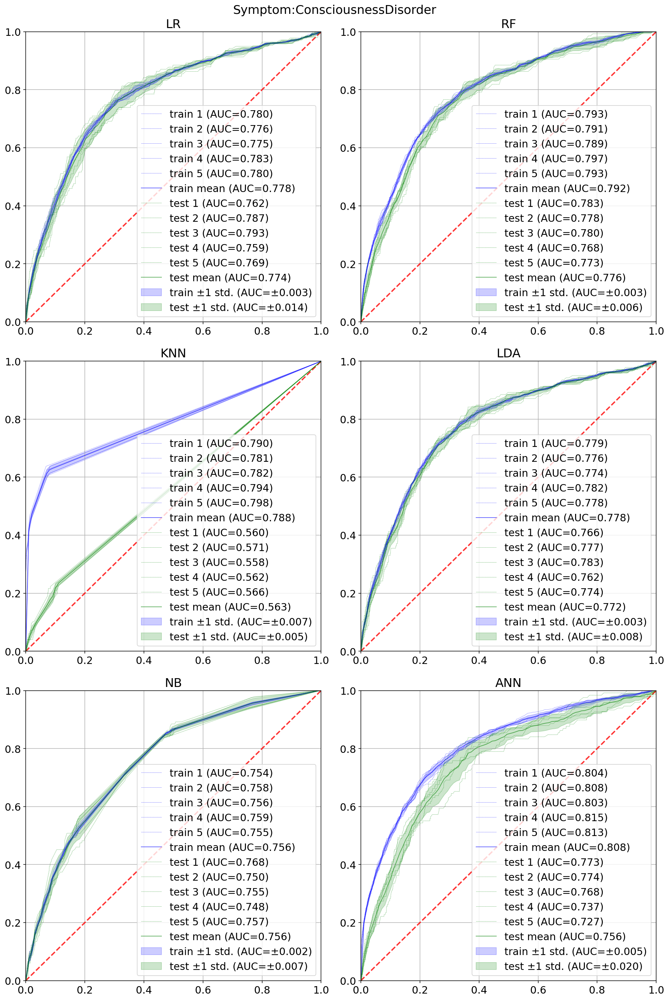

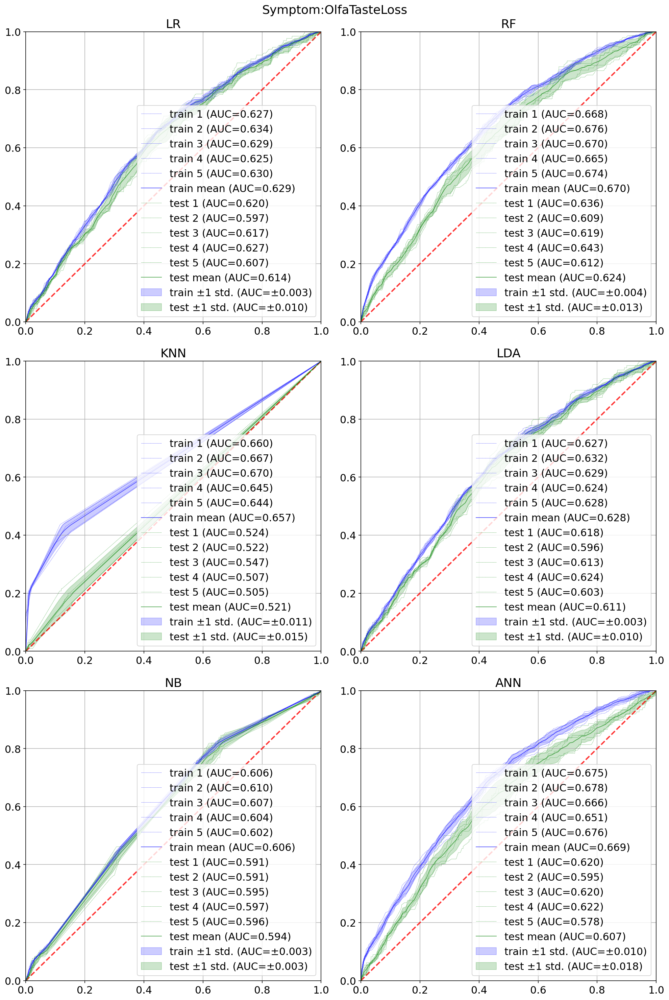

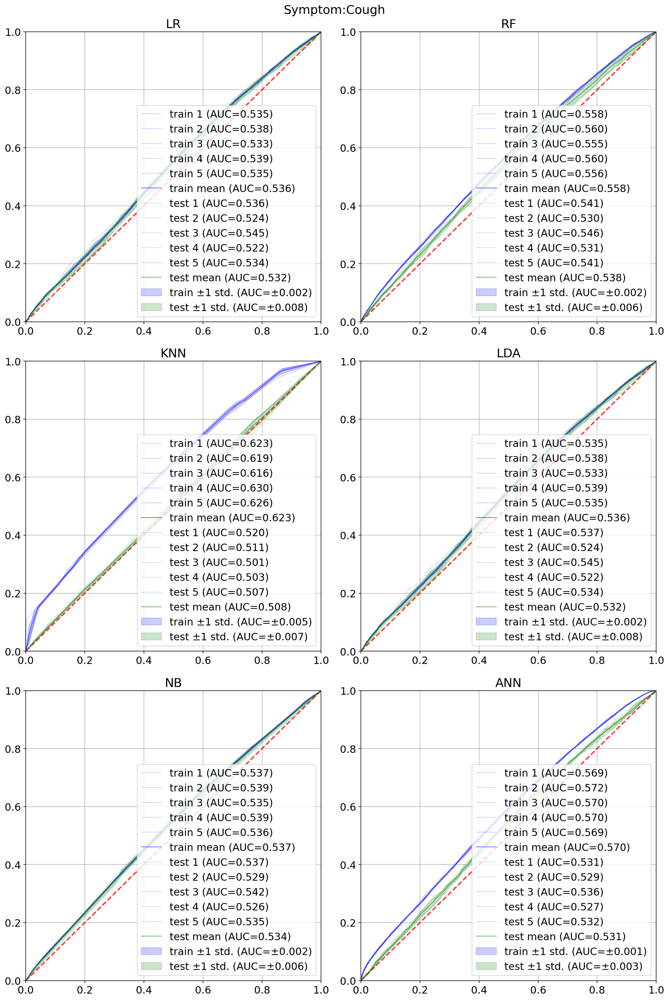

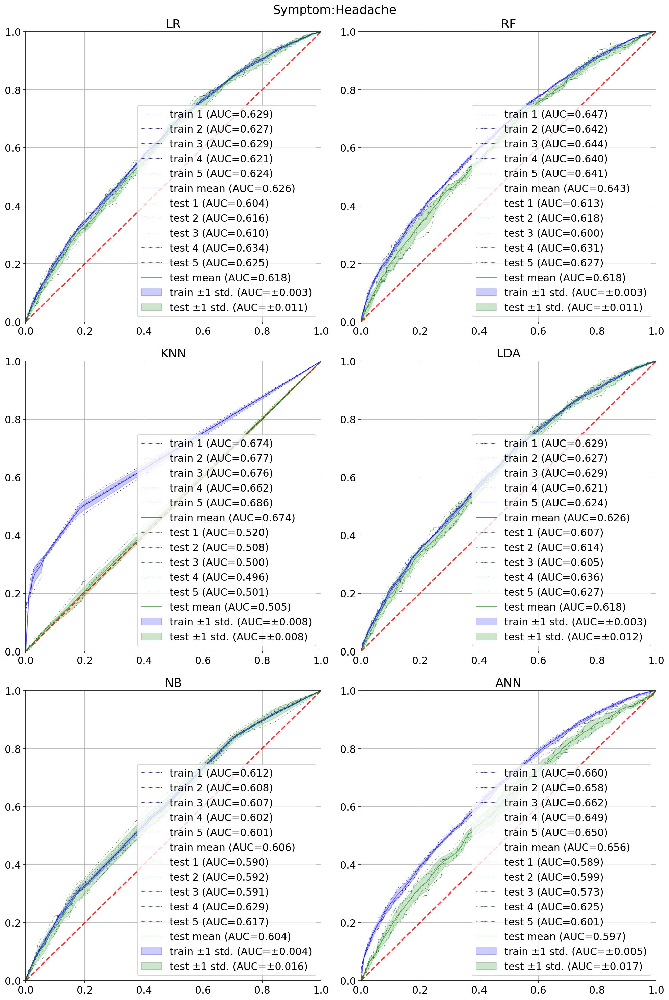

...

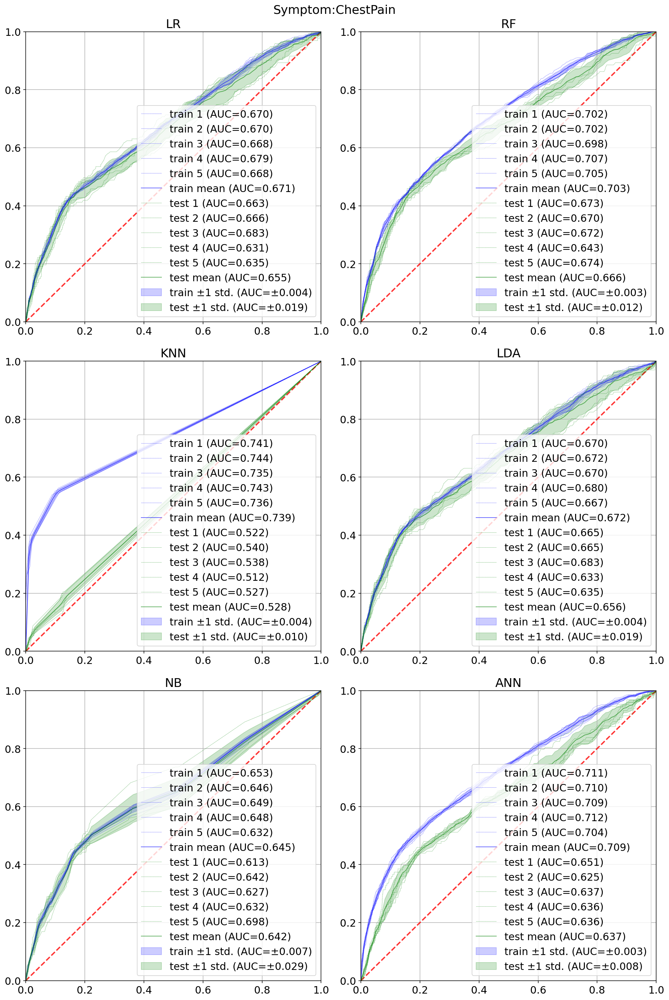

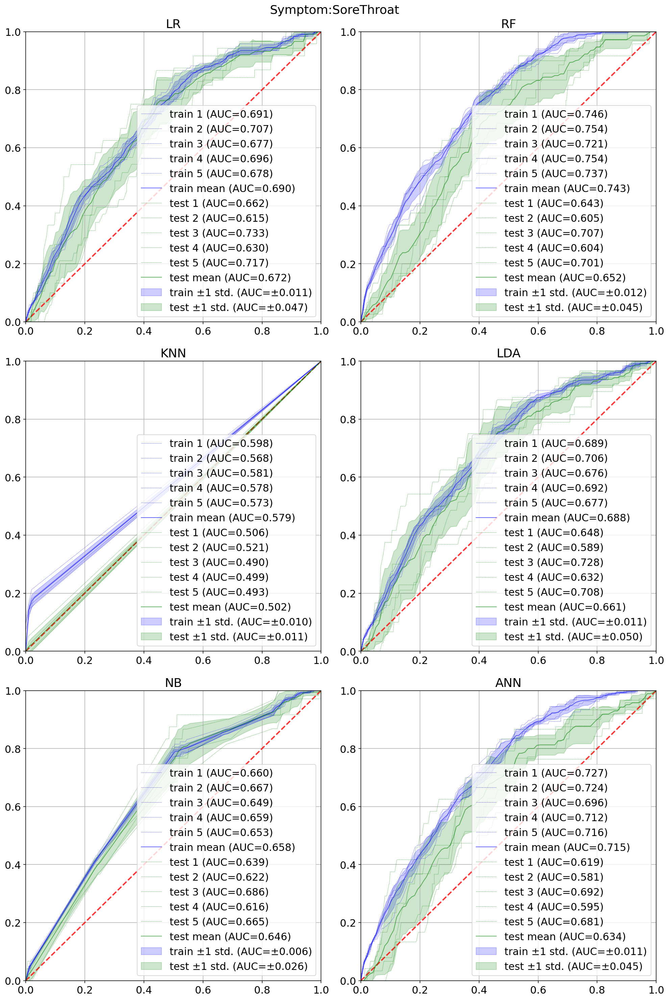

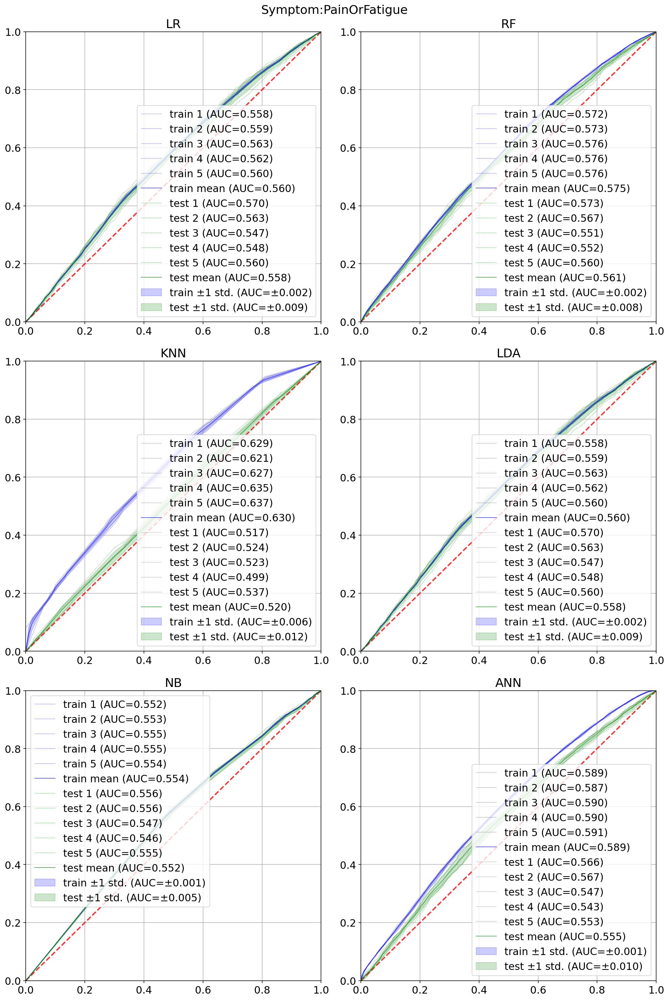

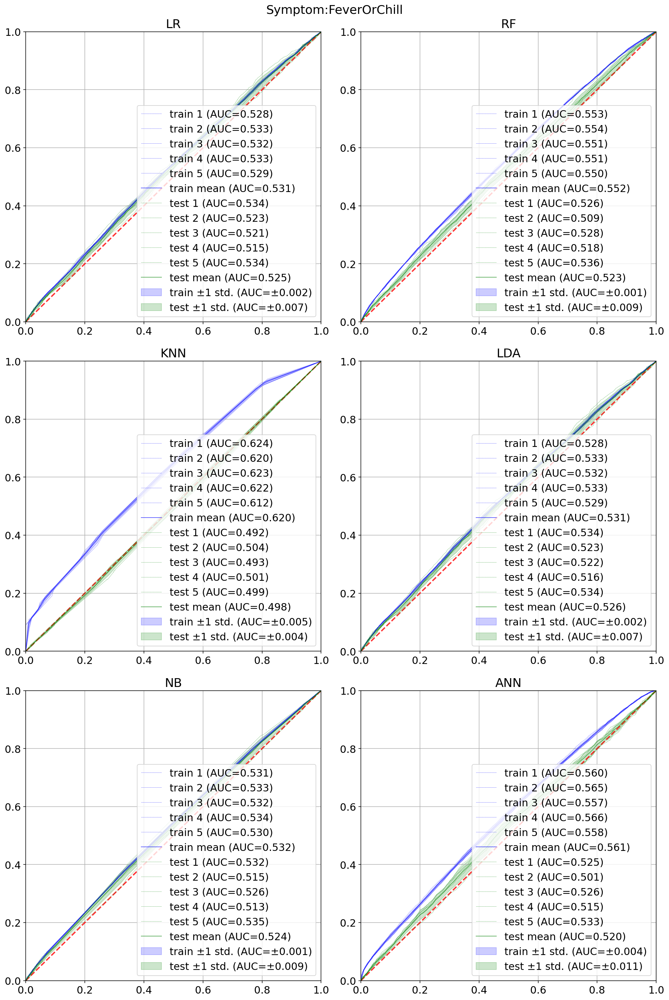

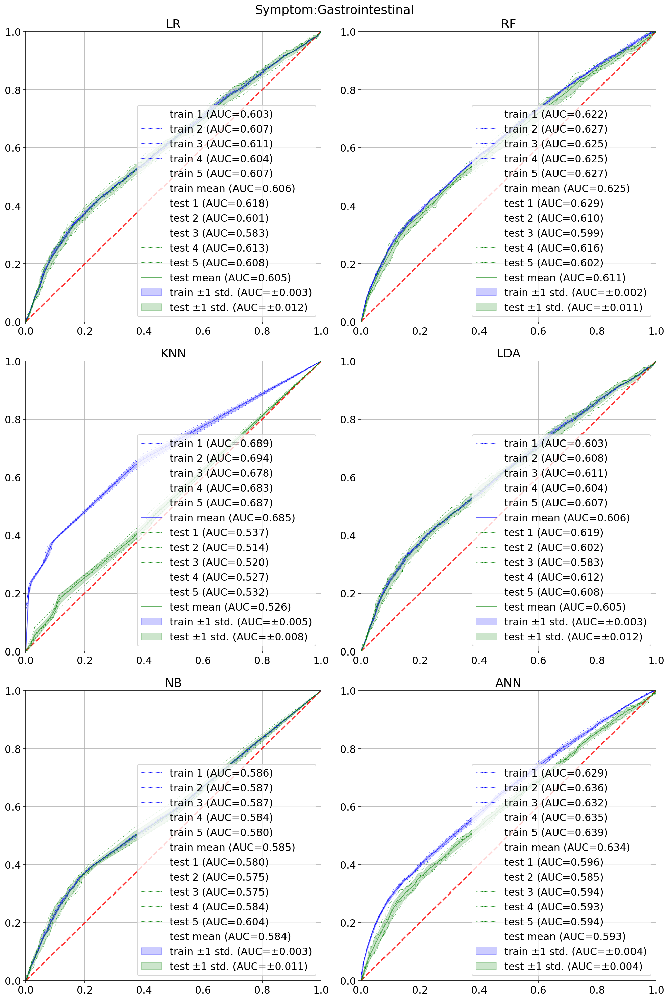

In [40]:
colors = {'train': 'b', 'test': 'g'}


def assure_dims(d_):
    if type(d_) is np.ndarray:
        return [d_[:, [i_]] for i_ in range(d_.shape[1])]
    return d_


for c_sym, sym in enumerate(target_cols):
    plot_rows = int(np.ceil(len(record_book_spm.keys()) / 2))
    _, subs = plt.subplots(plot_rows, 2, figsize=(14, 7 * plot_rows))
    subs = subs.flatten()

    for c_, (m_, r_) in enumerate(record_book_spm.items()):
        ax = subs[c_]
        plt.sca(ax)
        plt.title(m_.upper())
        plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', alpha=.8)
        for g_ in ['train', 'test']:
            tprs = []
            aucs = []
            for c2_, k_ in enumerate(r_):
                y_ = getattr(k_, f'Y_{g_}')[sym]
                p_ = assure_dims(getattr(k_, f'P_{g_}'))[c_sym][:, -1]
                fpr_, tpr_, _ = roc_curve(y_, p_)
                auc_ = roc_auc_score(y_, p_)
                plt.plot(fpr_,
                         tpr_,
                         color=colors[g_],
                         lw=0.5,
                         linestyle=':',
                         label=f'{g_} {c2_+1} (AUC={auc_:.3f})')
                tprs.append(np.interp(mean_fpr, fpr_, tpr_))
                tprs[-1][0] = 0.0
                aucs.append(auc_)
            mean_tpr = np.mean(tprs, axis=0)
            mean_tpr[-1] = 1.0
            mean_auc = auc(mean_fpr, mean_tpr)
            std_auc = np.std(aucs)
            plt.plot(mean_fpr,
                     mean_tpr,
                     color=colors[g_],
                     lw=1,
                     alpha=0.6,
                     label=f'{g_} mean (AUC={mean_auc:.3f})')
            std_tpr = np.std(tprs, axis=0)
            tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
            tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
            plt.fill_between(mean_fpr,
                             tprs_lower,
                             tprs_upper,
                             color=colors[g_],
                             alpha=.2,
                             label=f'{g_} ±1 std. (AUC=±{std_auc:.3f})')
        plt.legend()
        plt.grid()
        plt.xlim(0, 1)
        plt.ylim(0, 1)
    plt.suptitle(sym.replace('_', ':'))
    plt.tight_layout()
    plt.show()